In [96]:
%matplotlib inline

In [97]:
%reload_ext autoreload
%autoreload 2

In [98]:
import glob
import os
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from scipy.misc import imread, imresize

from skimage.feature import hog

from vehicleclassifier import VehicleClassifier
from detection import make_heatmap, get_hog_features, _transform_to_color_space
from process import Process

### Visualizations

In [99]:
def hog_(image):
    img = mpimg.imread(image)
    img = _transform_to_color_space(img, 'YCrCb')
    
    val = get_hog_features(img[:, :, 0],
                     orient=8, pix_per_cell=8, cell_per_block=2, vis=True, feature_vec=False)
    plt.imshow(val[1])
    
def show_image(image):
    plt.imshow(mpimg.imread(image))

In [100]:
car = './vehicles/GTI_Far/image0001.png'
non_car = './non-vehicles/GTI/image2.png'

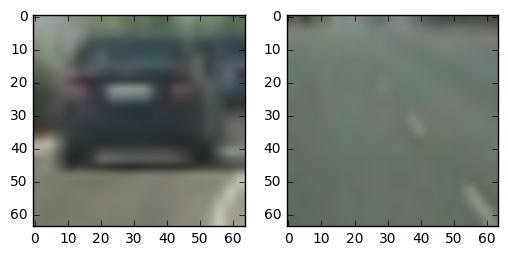

In [101]:
plt.subplot(121)
plt.imshow(mpimg.imread(car))
plt.subplot(122)
plt.imshow(mpimg.imread(non_car));

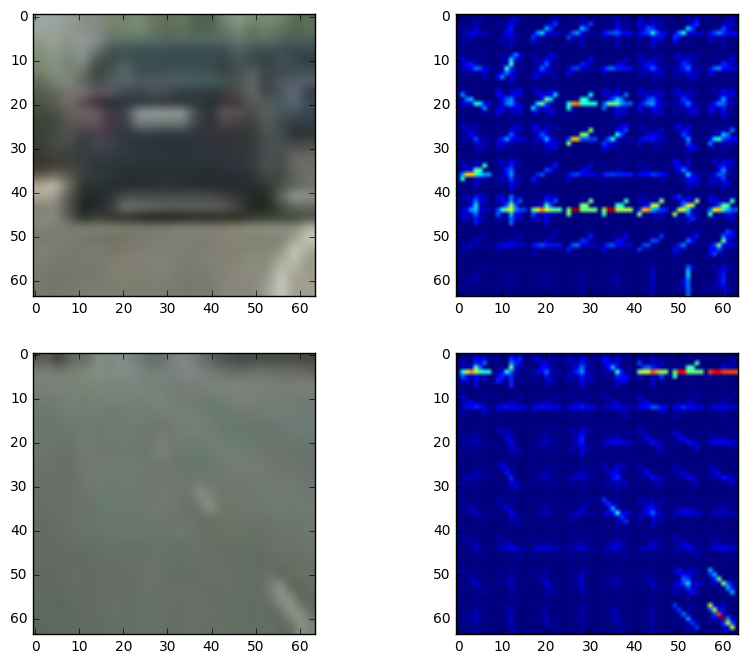

In [102]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
show_image(car)
plt.subplot(222)
hog_(car)
plt.subplot(223)
show_image(non_car)
plt.subplot(224)
hog_(non_car)

In [103]:
from detection import draw_boxes, average_boxes, Window, combine_boxes
import numpy as np

In [88]:
get_ipython().magic('matplotlib inline')

process = Process()

def draw_sliding_window(img):
    windows = process._find_likely_windows(img)
    return draw_boxes(img, windows)

def plot_images(image, image_path, process_function, save=False, title='Sliding Window Image'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.suptitle(image_path, fontsize=50)
    f.tight_layout()
    ax1.set_title('Original Image', fontsize=25)
    ax1.imshow(image)
    annotated_image = process_function(image)
    ax2.imshow(annotated_image)
    ax2.set_title(title, fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if save:
        name = os.path.basename(image_path)
        f.savefig(
            './output_images/' + '{}{}'.format(name.split('.')[0], '_sliding_window.jpg'))  # save the figure to file
        plt.close(f)  # close the figure



def plot_all_test_images(process_function, title):
    images = glob.glob('test_images/*.jpg')
    for image_path in images:
        img = mpimg.imread(image_path)
        plot_images(img, image_path, process_function, False, title)


In [89]:
###Visuallize Sliding Windows

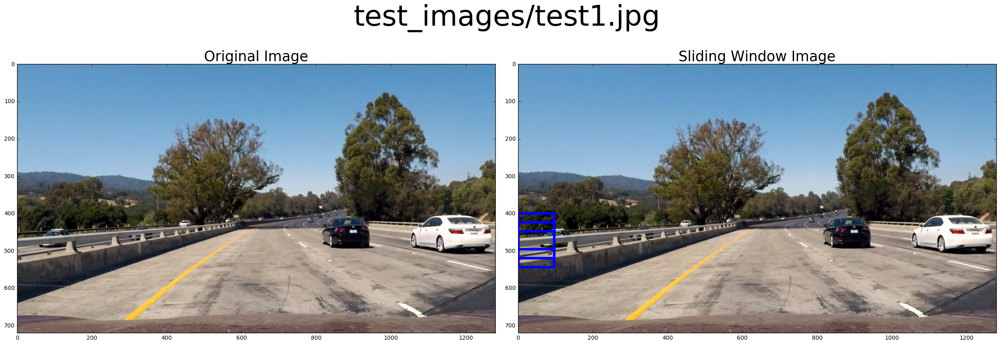

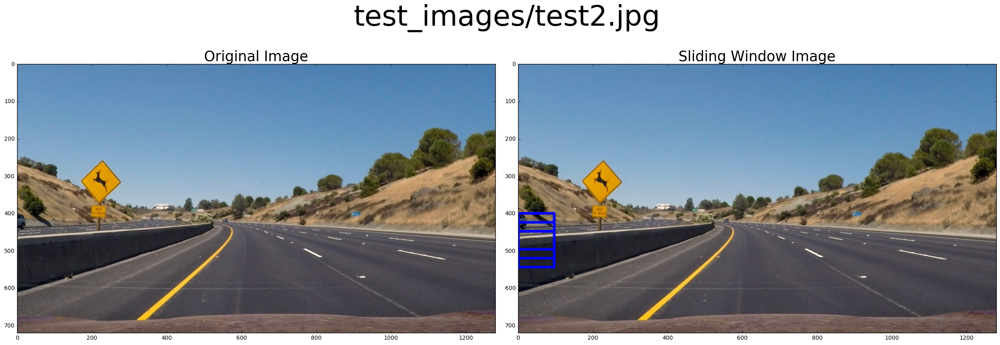

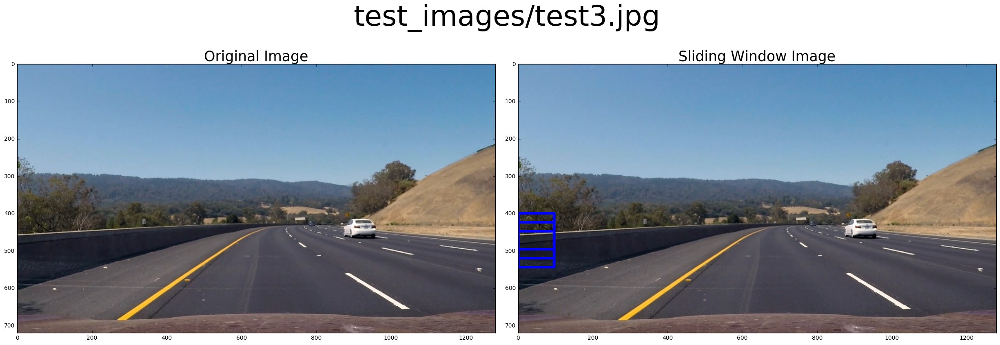

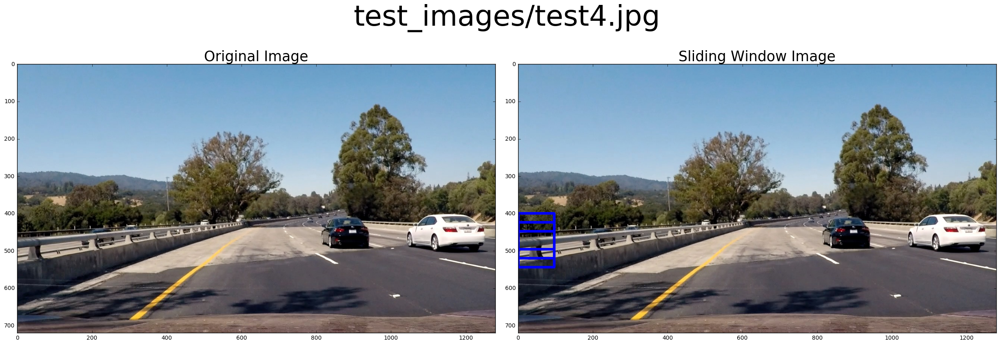

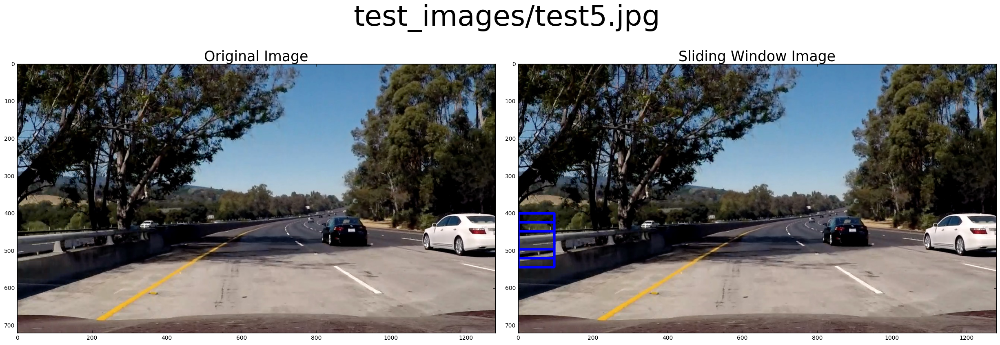

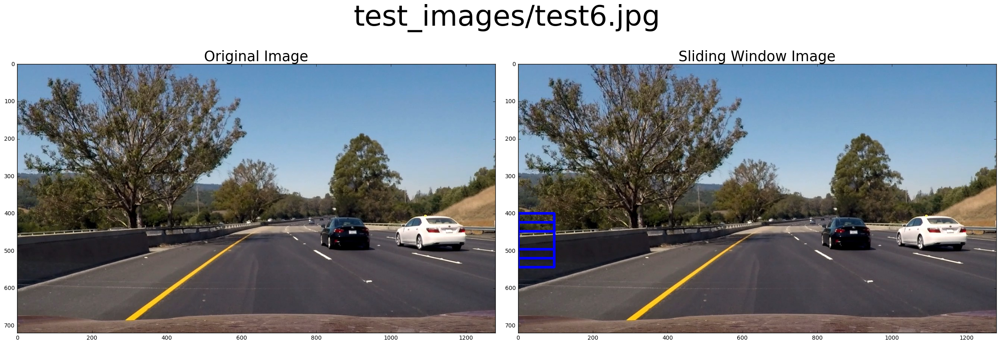

In [90]:
f = lambda image: draw_sliding_window(image)

plot_all_test_images(f, 'Sliding Window Image')

In [91]:
### Visualize Bounding Box

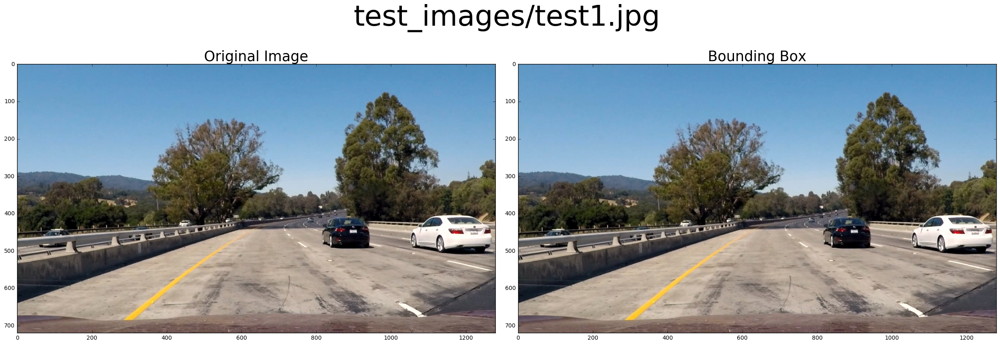

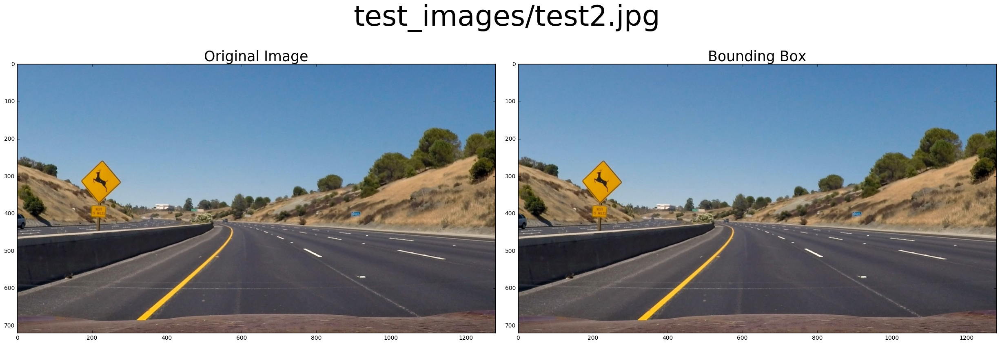

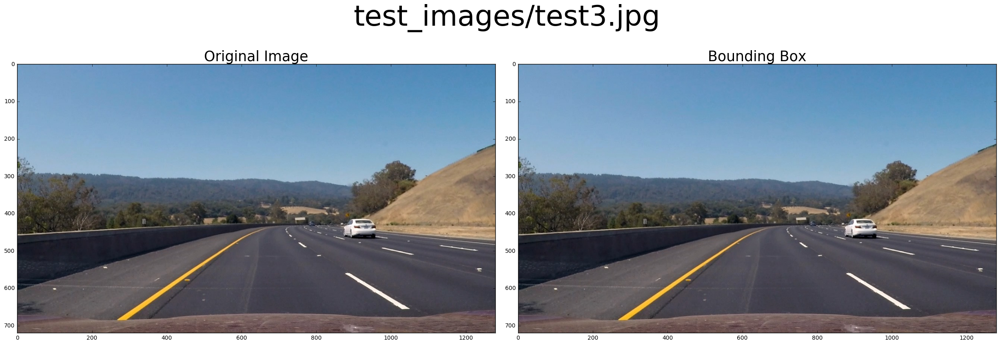

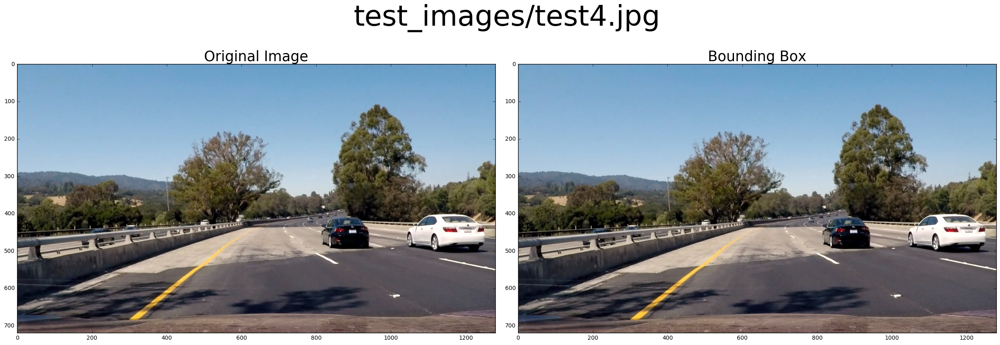

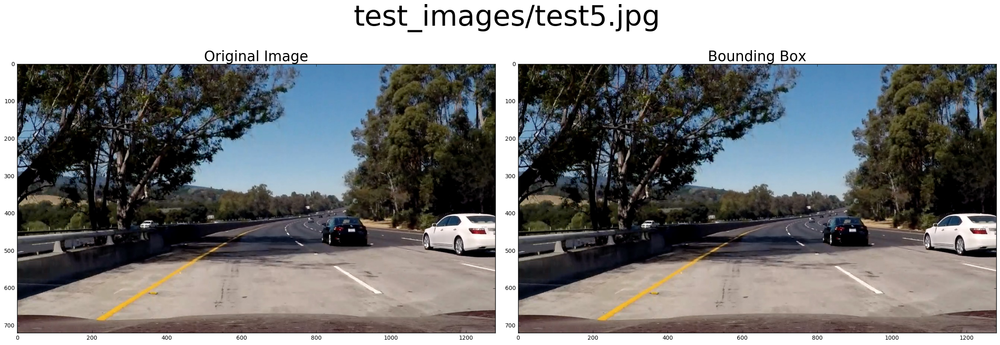

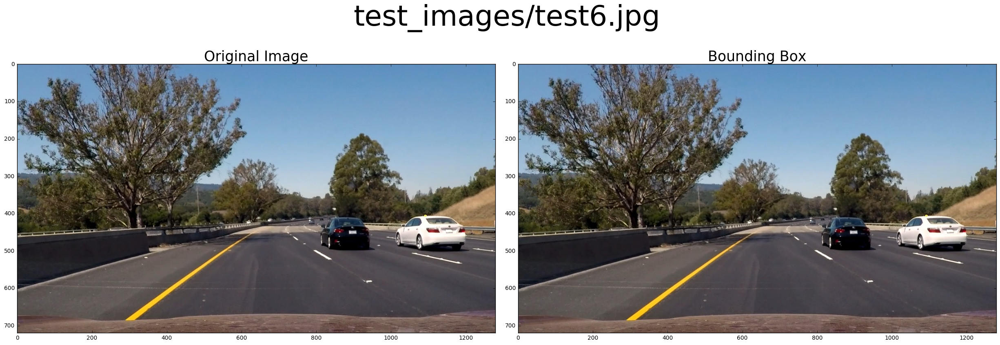

In [92]:
def draw_bounding_box(image):
    image = process._normalize(image)
    likely_windows = process._find_likely_windows(image)
    likely_windows = combine_boxes(likely_windows, image.shape)
    results, process.window.score = average_boxes(likely_windows, process.window.score, image.shape)
    draw_image = draw_boxes(image, likely_windows, color=(255, 0, 0), thick=6)
    return draw_image

f = lambda image: draw_bounding_box(image)

plot_all_test_images(f, 'Bounding Box')


### Visualize Heat Maps

Done


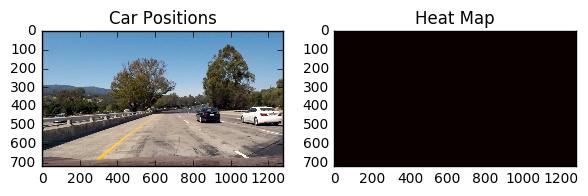

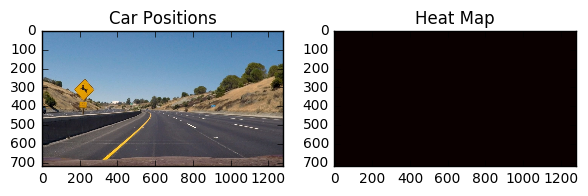

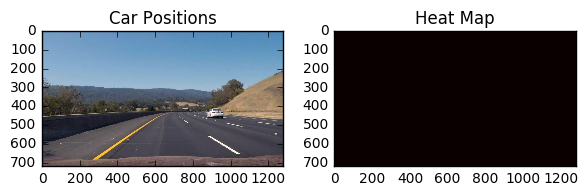

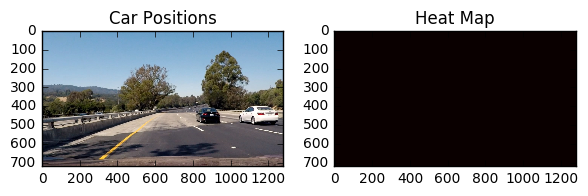

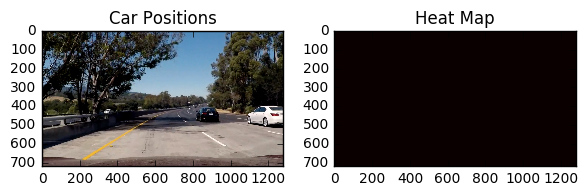

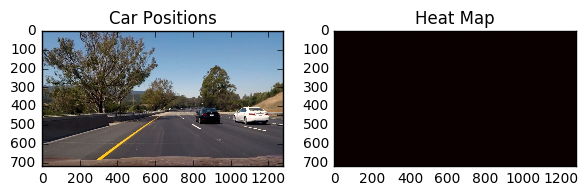

In [106]:
from visualizeheatmap import PlotHeatMap

PlotHeatMap().plot_all_heatmap_images()

print("Done")

In [177]:
def get_pic_by_id(x):
    return plt.imread(image_path.replace('6', str(x)))

In [200]:
process = Process()

In [201]:
for i in range(1, 5 + 1):
    process.process_image(get_pic_by_id(i), True)

In [202]:
image = get_pic_by_id(6)

In [203]:
draw_image = np.copy(image)
image = process._normalize(image)
likely_windows = process._find_likely_windows(image)
likely_windows = combine_boxes(likely_windows, image.shape)

# results, self.window.score = average_boxes(likely_windows, self.window.score, image.shape)

In [204]:
target_windows = likely_windows
old_boxes = process.window.score
image_shape = image.shape

In [214]:
from detection import find_center_box, add_center_box, find_windows

In [206]:
target_boxes = find_center_box(target_windows)
new_boxes = add_center_box(target_boxes, old_boxes)

filtered_boxes = [new_box for new_box in new_boxes if new_box[-1] > 2]

new_windows = [
    ((int(new_center[0] - new_width), int(new_center[1] - new_height)),
     (int(new_center[0] + new_width), int(new_center[1] + new_height)))
    for new_center, new_width, new_height, new_move, new_score in filtered_boxes
]

heat_map = make_heatmap(new_windows, image_shape)
if np.unique(heat_map)[-1] >= 2:
    labels = ndi.label(heat_map)[0]
    n = np.copy(labels)
    heat_map_2nd = np.zeros_like(heat_map)
    heat_map_2nd[heat_map >= 2] = 1
    labels_2 = ndi.label(heat_map_2nd)
    for index in range(1, labels_2[1] + 1):
        nonzero = (labels_2[0] == index).nonzero()
        num = labels[nonzero[0][0], nonzero[1][0]]
        labels[labels == num] = 0
    heat_map = labels + heat_map_2nd
    new_windows = find_windows(heat_map)

In [209]:
from scipy import ndimage as ndi

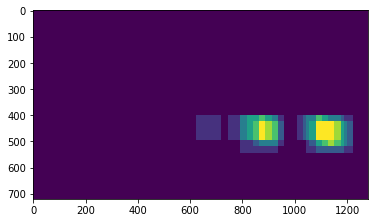

In [207]:
plt.imshow(labels)

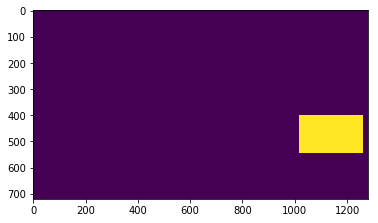

In [212]:
plt.imshow(ndi.label(heat_map)[0])

In [215]:
labels = ndi.label(heat_map)[0]
n = np.copy(labels)
heat_map_2nd = np.zeros_like(heat_map)
heat_map_2nd[heat_map >= 2] = 1
labels_2 = ndi.label(heat_map_2nd)
for index in range(1, labels_2[1] + 1):
    nonzero = (labels_2[0] == index).nonzero()
    num = labels[nonzero[0][0], nonzero[1][0]]
    labels[labels == num] = 0
heat_map = labels + heat_map_2nd
new_windows = find_windows(heat_map)

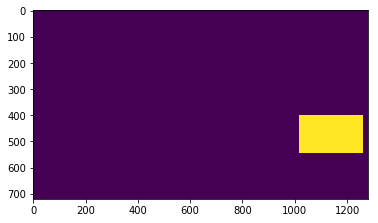

In [219]:
plt.imshow(labels)

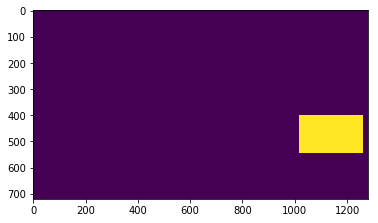

In [220]:
plt.imshow(heat_map)

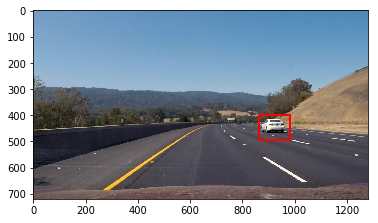

In [135]:
bounding_boxes = draw_boxes(draw_image, results, color=(0, 0, 255), thick=3)

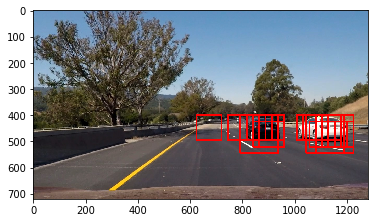

In [136]:
plt.imshow(bounding_boxes)

# Create features and train the classifier

### Features

In [42]:
clf = Classifier()
clf.create_features()
clf.load_features()

Vehicles     : 8792
Non-vehicles : 8968
Using 8 orientations 8 pixels per cell 2 cells per block
Feature vector length: 14208
Pickling features


### Model

In [61]:
clf.create_model()

Training time : 14s
Test accuracy : 99.16%
Pickling model


### Process video

In [120]:
process.process_video()

[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


100%|█████████▉| 1260/1261 [22:00<00:01,  1.04s/it]    | 1/1261 [00:01<21:56,  1.04s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 

